In [1]:
import sys
# Set the path to the repository here
sys.path.append("../")
import detr_tf
from detr_tf.inference import get_model_inference, numpy_bbox_to_image
from detr_tf.training_config import TrainingConfig, training_config_parser, CustomConfig
import matplotlib.pyplot as plt
import numpy as np
import time

import tensorflow as tf
tf.autograph.set_verbosity(0)

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 1:
    print("GPU")
    tf.config.experimental.set_memory_growth(physical_devices[0], True)

GPU


In [2]:
from detr_tf.training_config import TrainingConfig
from os.path import expanduser
import os

class CustomConfig(TrainingConfig):

    def __init__(self):
        super().__init__()        
        # Dataset info
        self.datadir = os.path.join("../data/WIDERface/")
        # The model is trained using fixed size images.
        # The following is the desired target image size, but it can be change based on your
        # dataset
        self.image_size = (480, 720)
        # Batch size
        self.batch_size = 1
        # Using the target batch size , the training loop will agregate the gradient on 38 steps
        # before to update the weights
        self.target_batch = 8

config = CustomConfig()

In [3]:
import tensorflow as tf
from random import shuffle
import pandas as pd
import imageio

from detr_tf.inference import numpy_bbox_to_image
from detr_tf import bbox
import numpy as np

from detr_tf.data import processing
from detr_tf.data.transformation import detr_transform

# Set the class name.
CLASS_NAMES = ["head"]
# Add the background class at the begining
CLASS_NAMES = ["background"] + CLASS_NAMES

def load_wider_data_from_index(index, class_names, filenames, train_val, anns, config, augmentation):
    # Open the image
    
    #image = imageio.imread(os.path.join(config.datadir, f"{train_val}", filenames[img_id]))
    image = imageio.imread(filenames[index])
    # Select all the annotatiom (bbox and class) on this image
    image_anns = anns[anns["filename"] == filenames[index]]    
    
    # Convert all string class to number (the target class)
    t_class = image_anns["class"].map(lambda x: class_names.index(x)).to_numpy()
    # Select the width&height of each image (should be the same since all the ann belongs to the same image)
    width = image_anns["width"].to_numpy()
    height = image_anns["height"].to_numpy()
    # Select the xmin, ymin, xmax and ymax of each bbox, Then, normalized the bbox to be between and 0 and 1
    # Finally, convert the bbox from xmin,ymin,xmax,ymax to x_center,y_center,width,height
    bbox_list = image_anns[["xmin", "ymin", "xmax", "ymax"]].to_numpy()
    bbox_list = bbox_list / [width[0], height[0], width[0], height[0]] 
    t_bbox = bbox.xy_min_xy_max_to_xcycwh(bbox_list)
    
    # Transform and augment image with bbox and class if needed
    image, t_bbox, t_class = detr_transform(image, t_bbox, t_class, config, augmentation=augmentation)

    # Normalized image
    image = processing.normalized_images(image, config)
            
    return image.astype(np.float32), t_bbox.astype(np.float32), np.ndarray.astype(np.expand_dims(t_class, axis=-1), np.int64)

#np.expand_dims(t_class, axis=-1)

def load_wider(train_val,batch_size, config, augmentation=False):
    """ Load the hardhat dataset
    """
    anns = pd.read_csv(f'{train_val}.csv')
    print(anns)
    CLASS_NAMES = ["background"] + anns["class"].unique().tolist()
    filenames = anns["filename"].unique().tolist()
    indexes = list(range(0, len(filenames)))
    shuffle(indexes)
    
    # Set the background class to 0
    unique_class = anns["class"].unique()
    unique_class.sort()
    config.background_class = 0
    class_names = ["background"] + unique_class.tolist()

    dataset = tf.data.Dataset.from_tensor_slices(indexes)
    dataset = dataset.map(lambda idx: processing.numpy_fc(
        idx, load_wider_data_from_index, 
        class_names=class_names, filenames=filenames, train_val=train_val, anns=anns, config=config, augmentation=augmentation)
    ,num_parallel_calls=tf.data.experimental.AUTOTUNE)
    

    # Filter labels to be sure to keep only sample with at least one bbox
    dataset = dataset.filter(lambda imgs, tbbox, tclass: tf.shape(tbbox)[0] > 0)
    # Pad bbox and labels
    dataset = dataset.map(processing.pad_labels, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    # Batch images
    dataset = dataset.batch(batch_size, drop_remainder=True)
    
    return dataset, class_names

In [4]:
train = pd.read_csv('train.csv')

In [5]:
i=0
for name in train['filename'].value_counts().index.tolist():
    try:
        img = Image.open(name)
    except:
        i+=1
        print(name)
        #cop.drop['../detr-tensorflow/data/WIDERface/WIDER_train/images/0--Parade/0_Parade_Parade_0_66.jpg']
print(i)

../data/WIDERface/WIDER_train/images/0--Parade/0_Parade_marchingband_1_841.jpg
../data/WIDERface/WIDER_train/images/52--Photographers/52_Photographers_taketouristphotos_52_151.jpg
../data/WIDERface/WIDER_train/images/12--Group/12_Group_Group_12_Group_Group_12_184.jpg
../data/WIDERface/WIDER_train/images/0--Parade/0_Parade_Parade_0_66.jpg
../data/WIDERface/WIDER_train/images/0--Parade/0_Parade_marchingband_1_692.jpg
../data/WIDERface/WIDER_train/images/7--Cheering/7_Cheering_Cheering_7_494.jpg
../data/WIDERface/WIDER_train/images/2--Demonstration/2_Demonstration_Protesters_2_346.jpg
../data/WIDERface/WIDER_train/images/0--Parade/0_Parade_Parade_0_496.jpg
../data/WIDERface/WIDER_train/images/2--Demonstration/2_Demonstration_Protesters_2_20.jpg
../data/WIDERface/WIDER_train/images/6--Funeral/6_Funeral_Funeral_6_100.jpg
../data/WIDERface/WIDER_train/images/0--Parade/0_Parade_Parade_0_7.jpg
../data/WIDERface/WIDER_train/images/0--Parade/0_Parade_marchingband_1_408.jpg
../data/WIDERface/WIDE

../data/WIDERface/WIDER_train/images/2--Demonstration/2_Demonstration_Demonstrators_2_529.jpg
../data/WIDERface/WIDER_train/images/23--Shoppers/23_Shoppers_Shoppers_23_1007.jpg
../data/WIDERface/WIDER_train/images/44--Aerobics/44_Aerobics_Aerobics_44_752.jpg
../data/WIDERface/WIDER_train/images/22--Picnic/22_Picnic_Picnic_22_473.jpg
../data/WIDERface/WIDER_train/images/12--Group/12_Group_Group_12_Group_Group_12_570.jpg
../data/WIDERface/WIDER_train/images/0--Parade/0_Parade_marchingband_1_140.jpg
../data/WIDERface/WIDER_train/images/2--Demonstration/2_Demonstration_Demonstration_Or_Protest_2_919.jpg
../data/WIDERface/WIDER_train/images/20--Family_Group/20_Family_Group_Family_Group_20_855.jpg
../data/WIDERface/WIDER_train/images/17--Ceremony/17_Ceremony_Ceremony_17_625.jpg
../data/WIDERface/WIDER_train/images/2--Demonstration/2_Demonstration_Political_Rally_2_2.jpg
../data/WIDERface/WIDER_train/images/40--Gymnastics/40_Gymnastics_Gymnastics_40_952.jpg
../data/WIDERface/WIDER_train/image

../data/WIDERface/WIDER_train/images/20--Family_Group/20_Family_Group_Family_Group_20_297.jpg
../data/WIDERface/WIDER_train/images/55--Sports_Coach_Trainer/55_Sports_Coach_Trainer_sportcoaching_55_691.jpg
../data/WIDERface/WIDER_train/images/50--Celebration_Or_Party/50_Celebration_Or_Party_houseparty_50_155.jpg
../data/WIDERface/WIDER_train/images/23--Shoppers/23_Shoppers_Shoppers_23_137.jpg
../data/WIDERface/WIDER_train/images/17--Ceremony/17_Ceremony_Ceremony_17_474.jpg
../data/WIDERface/WIDER_train/images/54--Rescue/54_Rescue_rescuepeople_54_284.jpg
../data/WIDERface/WIDER_train/images/2--Demonstration/2_Demonstration_Political_Rally_2_944.jpg
../data/WIDERface/WIDER_train/images/61--Street_Battle/61_Street_Battle_streetfight_61_661.jpg
../data/WIDERface/WIDER_train/images/30--Surgeons/30_Surgeons_Surgeons_30_466.jpg
../data/WIDERface/WIDER_train/images/41--Swimming/41_Swimming_Swimming_41_628.jpg
../data/WIDERface/WIDER_train/images/5--Car_Accident/5_Car_Accident_Accident_5_434.jpg

../data/WIDERface/WIDER_train/images/12--Group/12_Group_Large_Group_12_Group_Large_Group_12_724.jpg
../data/WIDERface/WIDER_train/images/40--Gymnastics/40_Gymnastics_Gymnastics_40_1038.jpg
../data/WIDERface/WIDER_train/images/39--Ice_Skating/39_Ice_Skating_Ice_Skating_39_32.jpg
../data/WIDERface/WIDER_train/images/9--Press_Conference/9_Press_Conference_Press_Conference_9_170.jpg
../data/WIDERface/WIDER_train/images/40--Gymnastics/40_Gymnastics_Gymnastics_40_564.jpg
../data/WIDERface/WIDER_train/images/43--Row_Boat/43_Row_Boat_Rowboat_43_7.jpg
../data/WIDERface/WIDER_train/images/31--Waiter_Waitress/31_Waiter_Waitress_Waiter_Waitress_31_786.jpg
../data/WIDERface/WIDER_train/images/56--Voter/56_Voter_peoplevoting_56_290.jpg
../data/WIDERface/WIDER_train/images/16--Award_Ceremony/16_Award_Ceremony_Awards_Ceremony_16_260.jpg
../data/WIDERface/WIDER_train/images/50--Celebration_Or_Party/50_Celebration_Or_Party_birthdayparty_50_154.jpg
../data/WIDERface/WIDER_train/images/19--Couple/19_Coupl

../data/WIDERface/WIDER_train/images/7--Cheering/7_Cheering_Cheering_7_178.jpg
../data/WIDERface/WIDER_train/images/9--Press_Conference/9_Press_Conference_Press_Conference_9_677.jpg
../data/WIDERface/WIDER_train/images/5--Car_Accident/5_Car_Accident_Accident_5_150.jpg
../data/WIDERface/WIDER_train/images/25--Soldier_Patrol/25_Soldier_Patrol_Soldier_Patrol_25_582.jpg
../data/WIDERface/WIDER_train/images/28--Sports_Fan/28_Sports_Fan_Sports_Fan_28_387.jpg
../data/WIDERface/WIDER_train/images/13--Interview/13_Interview_Interview_On_Location_13_372.jpg
../data/WIDERface/WIDER_train/images/41--Swimming/41_Swimming_Swimmer_41_374.jpg
../data/WIDERface/WIDER_train/images/20--Family_Group/20_Family_Group_Family_Group_20_1033.jpg
../data/WIDERface/WIDER_train/images/44--Aerobics/44_Aerobics_Aerobics_44_662.jpg
../data/WIDERface/WIDER_train/images/41--Swimming/41_Swimming_Swimmer_41_661.jpg
../data/WIDERface/WIDER_train/images/30--Surgeons/30_Surgeons_Surgeons_30_419.jpg
../data/WIDERface/WIDER_t

In [6]:
from detr_tf.networks.detr import get_detr_model

detr = get_detr_model(config, include_top=False, nb_class=2, weights="detr")
#detr.load_weights("detr-learn-third10.ckpt")
detr.load_weights("detr-transfolearn-third.ckpt")

#detr = get_detr_model(config, nb_class=2, include_top=True, weights=None, tf_backbone=True)
#detr.load_weights("detr-learn-third10.ckpt")

Load weights from weights/detr\detr.ckpt
(6, None, 100, 256)


In [ ]:
detr.summary()

In [7]:
import tensorflow as tf
tf.autograph.set_verbosity(0)
import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)

In [5]:
from detr_tf.data import load_wider_test

test_iterator, class_names = load_wider_test(config.batch_size, config, augmentation=False,exclude=[])

                                               filename  width  height class  \
0     ../data/WIDERface/WIDER_test/images/0--Parade/...   1024     653  head   
1     ../data/WIDERface/WIDER_test/images/0--Parade/...   1024     684  head   
2     ../data/WIDERface/WIDER_test/images/0--Parade/...   1024     751  head   
3     ../data/WIDERface/WIDER_test/images/0--Parade/...   1024     578  head   
4     ../data/WIDERface/WIDER_test/images/0--Parade/...   1024     681  head   
...                                                 ...    ...     ...   ...   
5362  ../data/WIDERface/WIDER_test/images/21--Festiv...   1024    1366  head   
5363  ../data/WIDERface/WIDER_test/images/21--Festiv...   1024     683  head   
5364  ../data/WIDERface/WIDER_test/images/21--Festiv...   1024    1289  head   
5365  ../data/WIDERface/WIDER_test/images/21--Festiv...   1024     683  head   
5366  ../data/WIDERface/WIDER_test/images/21--Festiv...   1024     682  head   

        x    y  w  h  
0     0.0  0.0  

Done predictions with time 4.958 s
tf.Tensor(
[0.9872968  0.9819264  0.9642535  0.97382057 0.94718814 0.84566194
 0.65729654 0.76382595 0.91017854 0.77278394 0.6386996  0.6785486 ], shape=(12,), dtype=float32)
(12,)


..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [9].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [11], which does not match the required output shape [9].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\detr_

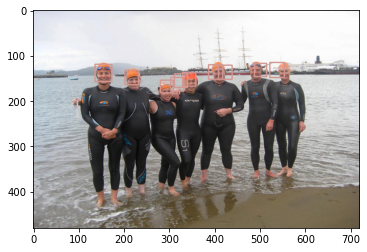

Done predictions with time 0.486 s
tf.Tensor([0.9904564  0.89451873], shape=(2,), dtype=float32)
(2,)


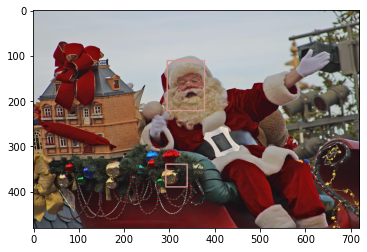

Done predictions with time 0.518 s
tf.Tensor(
[0.9947001  0.9931632  0.99427503 0.9923366  0.99269694 0.993233
 0.99314004 0.9932614  0.98849505 0.99351525 0.99189526 0.98338217
 0.9855838  0.97977096 0.9819178  0.987457   0.9720266  0.9831009
 0.9662764  0.9709528  0.9332818  0.9582129  0.96513665 0.95325977
 0.96081066 0.8959818  0.91821104 0.96434325 0.9649235  0.9672365
 0.9522599  0.95739335 0.93439317 0.90526944 0.8611286  0.9633906
 0.8604457  0.9552797  0.9595803  0.89798224 0.7405236  0.8611744
 0.89805764 0.9004112  0.9470862  0.9032885  0.7735182  0.83823395
 0.8944793  0.9269694  0.9281965  0.79814506 0.8455779  0.91933393
 0.9379546  0.93500125 0.91414165 0.9160772  0.7571288  0.8076173
 0.8948203  0.9392434  0.90920925 0.92479616 0.84922713 0.85326207
 0.91549367 0.5477634  0.7982476  0.69447774 0.6608284  0.86584073
 0.7089535  0.8425362  0.8742272  0.50707275 0.8130085  0.78527164
 0.6217168  0.6866294  0.82963073 0.5582269  0.57895887 0.88578516], shape=(84,), dtype=fl

..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [83], which does not match the required output shape [79].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [83], which does not match the required output shape [79].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\det

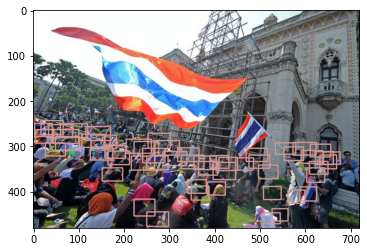

Done predictions with time 0.507 s
tf.Tensor(
[0.97450227 0.98935974 0.99181634 0.9502579  0.95134044 0.6226591
 0.95472115 0.9215698  0.8541221  0.74155    0.7109609  0.563475
 0.5250402  0.57538486], shape=(14,), dtype=float32)
(14,)


..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [10], which does not match the required output shape [8].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [10], which does not match the required output shape [8].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\detr_

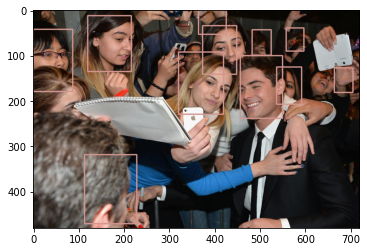

Done predictions with time 0.531 s
tf.Tensor(
[0.9590354  0.9815963  0.9621061  0.86575997 0.53943187 0.7813813
 0.5453633  0.6578725  0.6644789  0.51155937 0.8184293  0.5285615 ], shape=(12,), dtype=float32)
(12,)


..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [10], which does not match the required output shape [7].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [10], which does not match the required output shape [7].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\detr_

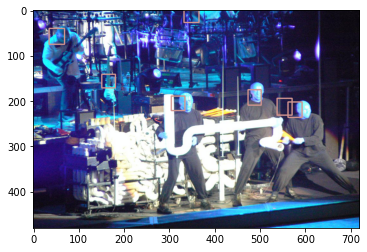

Done predictions with time 0.501 s
tf.Tensor(
[0.9948462  0.9943388  0.9950388  0.99279284 0.9956043  0.99643624
 0.99509263 0.989247   0.9947798  0.9933147  0.99704653 0.9749439
 0.9949581  0.99534386 0.9949825  0.98377013 0.98353577 0.9955414
 0.9954992  0.9857983  0.99035454 0.98747617 0.99347275 0.9907454
 0.97009325 0.9914198  0.9865481  0.97542965 0.9735468  0.9612669
 0.973752   0.9786944  0.96839213 0.9960238  0.9802719  0.9703447
 0.948944   0.97473043 0.96436864 0.97144777 0.9841982  0.9490695
 0.9526255  0.9778771  0.9295758  0.94745654 0.97119594 0.97847193
 0.9307716  0.945018   0.90714484 0.90260094 0.97044355 0.935949
 0.9492671  0.91444755 0.91318226 0.97749066 0.94436955 0.97132987
 0.92836624 0.97027594 0.9769232  0.9205274  0.8828476  0.89829624
 0.8978843  0.85413754 0.92691267 0.9599706  0.94491875 0.9362906
 0.96533537 0.93904907 0.9580245  0.85977453 0.90656716 0.891159
 0.8560729  0.82396054 0.8553685  0.94301313 0.9340883  0.8570153
 0.88455635 0.946736   0.817

..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [99], which does not match the required output shape [95].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [99], which does not match the required output shape [95].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\det

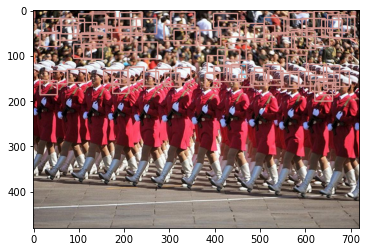

Done predictions with time 0.506 s
tf.Tensor(
[0.98208743 0.98451185 0.99001724 0.9761085  0.9835195  0.9894348
 0.9932325  0.9709721  0.9574363  0.9914648  0.99011314 0.9686515
 0.98017853 0.9814951  0.9833592  0.9670993  0.8819842  0.98777044
 0.9832691  0.93108207 0.93295825 0.8938204  0.96923    0.95922196
 0.81307465 0.8635241  0.9431644  0.86923754 0.88639414 0.6550254
 0.88660663 0.85618854 0.84086114 0.9402609  0.8248739  0.71986204
 0.71763617 0.663789   0.7874094  0.8843196  0.90597427 0.70812744
 0.83492595 0.7229656  0.5951889  0.7425384  0.6840992  0.6243964
 0.76200134 0.84174967 0.57662976 0.70319915 0.5190857  0.7663936
 0.69514936 0.5211804  0.58838457 0.56642413 0.51034063 0.59911776], shape=(60,), dtype=float32)
(60,)


..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [59], which does not match the required output shape [56].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [59], which does not match the required output shape [56].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\det

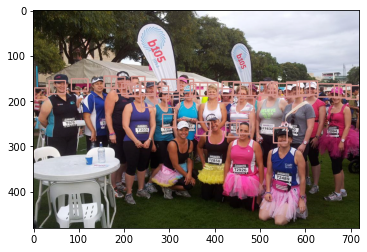

Done predictions with time 0.499 s
tf.Tensor(
[0.98636764 0.9898178  0.9157055  0.98572415 0.82125235 0.7192456
 0.84126943 0.86414677 0.62784576 0.768887   0.7214674  0.5289234 ], shape=(12,), dtype=float32)
(12,)


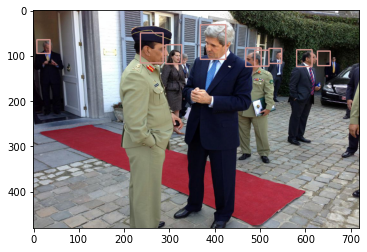

Done predictions with time 0.500 s
tf.Tensor([0.9936907], shape=(1,), dtype=float32)
(1,)


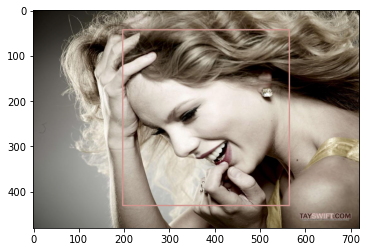

Done predictions with time 0.482 s
tf.Tensor([0.9862321  0.98978066 0.99057966 0.6908432  0.9201123 ], shape=(5,), dtype=float32)
(5,)


..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [3], which does not match the required output shape [1].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [3], which does not match the required output shape [1].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\detr_tf

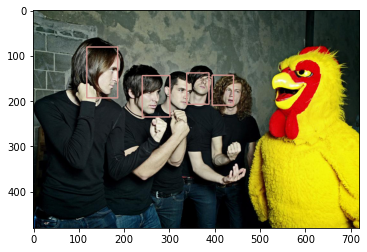

Done predictions with time 0.524 s
tf.Tensor([0.9957195], shape=(1,), dtype=float32)
(1,)


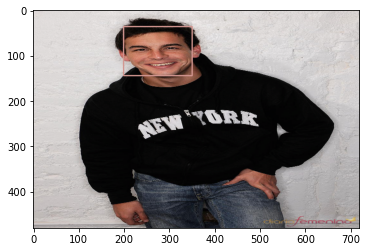

Done predictions with time 0.488 s
tf.Tensor(
[0.9892281  0.98556244 0.98868376 0.9728505  0.98444366 0.9484935
 0.8278438  0.9611063  0.84022635 0.8278433  0.5983572  0.55226195
 0.6978479  0.56571    0.89367557 0.6248986  0.5078662 ], shape=(17,), dtype=float32)
(17,)


..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [16], which does not match the required output shape [14].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [16], which does not match the required output shape [14].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\det

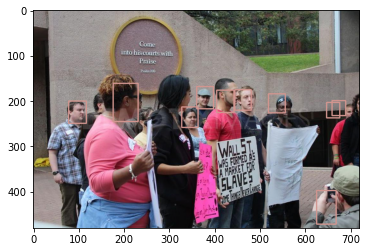

Done predictions with time 0.484 s
tf.Tensor(
[0.97311777 0.9833341  0.98631823 0.97072583 0.99083555 0.9914533
 0.9818947  0.95185506 0.98411924 0.9864715  0.9899099  0.97385675
 0.98082227 0.97658896 0.98710304 0.9703306  0.9512823  0.9810585
 0.9788031  0.9610039  0.9779795  0.9678677  0.9851109  0.95204914
 0.95607734 0.97391427 0.9730824  0.9604101  0.92647564 0.8843634
 0.9598421  0.9724835  0.95764464 0.9676792  0.92973834 0.9367787
 0.9382303  0.9239258  0.9602751  0.92879194 0.9350683  0.9349532
 0.9333967  0.9576883  0.9111022  0.91976243 0.8347681  0.97225124
 0.8502929  0.8965791  0.8853312  0.89073354 0.94401085 0.8980905
 0.93617207 0.92534685 0.7878727  0.9445867  0.93693817 0.8894004
 0.8898693  0.92690396 0.8386789  0.84404767 0.76977396 0.9399367
 0.84145635 0.85907966 0.8738703  0.69005406 0.64378744 0.8893993
 0.8979891  0.7435765  0.5838201  0.6875501  0.8247455  0.9078647
 0.8807158  0.7093096  0.5702292  0.91727746 0.8274315  0.8078449
 0.7771641  0.9111119  0.76

..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [98], which does not match the required output shape [96].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [98], which does not match the required output shape [96].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\det

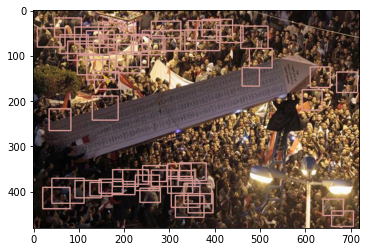

Done predictions with time 0.473 s
tf.Tensor(
[0.94663835 0.88772404 0.9942017  0.7896896  0.9092387  0.9933431
 0.9946904  0.9845436  0.96847904 0.9930803  0.992773   0.99065596
 0.98534065 0.9907741  0.9924965  0.97398597 0.8666027  0.9104027
 0.975041   0.9668733  0.9812166  0.9671273  0.9770225  0.9710463
 0.589268   0.9458567  0.9488312  0.95452803 0.92470527 0.92829394
 0.9629744  0.9580541  0.9461637  0.97132134 0.9203668  0.8405829
 0.91385174 0.94494593 0.95845366 0.585938   0.8238843  0.83904797
 0.94793266 0.9052353  0.9096054  0.9526715  0.92978233 0.88149935
 0.8829912  0.50838864 0.92032313 0.88358784 0.92002606 0.9578463
 0.91433686 0.8788867  0.78622717 0.9144254  0.82293683 0.61602587
 0.8621171  0.915796   0.8454783  0.7896505  0.82743925 0.84602034
 0.7896788  0.6534685  0.70224404 0.8489646  0.8606398  0.5865778
 0.6886838  0.8944127  0.78538305 0.76698834 0.7327125  0.7285796
 0.65450424 0.8566717  0.8470838  0.74245036 0.77785105 0.67213285
 0.67817616 0.7188413  

..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [87], which does not match the required output shape [84].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [87], which does not match the required output shape [84].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\det

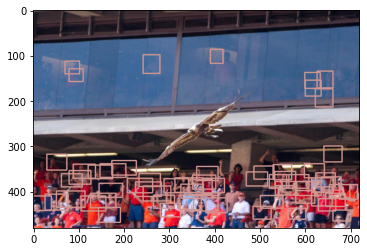

Done predictions with time 0.481 s
tf.Tensor(
[0.98216736 0.98349273 0.98613423 0.9620559  0.9703569  0.9499152
 0.66197395 0.9629742  0.9096648  0.8536007  0.56626654 0.95156413
 0.5849718  0.85007834 0.7731241  0.7477187  0.59303415 0.5759796
 0.5346333 ], shape=(19,), dtype=float32)
(19,)


..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [18], which does not match the required output shape [15].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [18], which does not match the required output shape [15].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\det

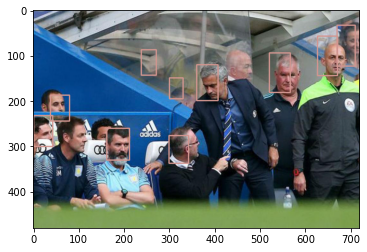

Done predictions with time 0.489 s
tf.Tensor([0.9830572 0.937626  0.5769429], shape=(3,), dtype=float32)
(3,)


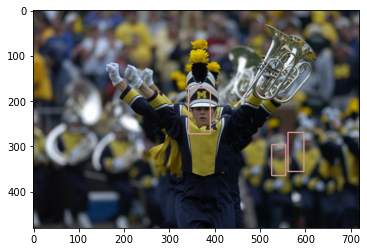

Done predictions with time 0.518 s
tf.Tensor(
[0.98654556 0.98647183 0.9789842  0.95932716 0.9467709  0.9440781
 0.98971564 0.9853205  0.97527516 0.9439489  0.939099   0.9260019
 0.8979134  0.925835   0.9189576  0.9103048  0.90899515 0.92273754
 0.9194925  0.6817719  0.7311776  0.6498083  0.8897307  0.83585995
 0.61517113 0.685647   0.7461186  0.6899083  0.77737826 0.79982615
 0.569121   0.56063735 0.781332   0.8181386  0.54864275 0.65786546
 0.5179149  0.6633368  0.6235146  0.5689676  0.60823524 0.6349595
 0.51162606 0.67652303 0.54054666 0.6581585  0.5285096  0.54214424], shape=(48,), dtype=float32)
(48,)


..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [40], which does not match the required output shape [38].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [40], which does not match the required output shape [38].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\det

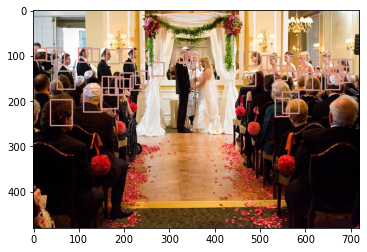

Done predictions with time 0.496 s
tf.Tensor(
[0.9911342  0.9854205  0.9856052  0.98258185 0.98532885 0.9880512
 0.99000144 0.96646744 0.9800164  0.98790747 0.9891059  0.9384623
 0.96130157 0.98119855 0.9691198  0.93803966 0.88011885 0.9873403
 0.9717628  0.8700453  0.81479543 0.7685148  0.9588311  0.91691583
 0.6819207  0.7030541  0.87535024 0.7742777  0.8135752  0.6393505
 0.7646186  0.77135605 0.7178376  0.88406986 0.5698085  0.5280493
 0.5525387  0.59877414 0.72893286 0.74608314 0.5974568  0.65989107
 0.52140427 0.56099355], shape=(44,), dtype=float32)
(44,)


..\detr_tf\inference.py:96: UserWarning: An output with one or more elements was resized since it had shape [43], which does not match the required output shape [39].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(x1, 0, idx, out=xx1)
..\detr_tf\inference.py:97: UserWarning: An output with one or more elements was resized since it had shape [43], which does not match the required output shape [39].This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at  ..\aten\src\ATen\native\Resize.cpp:23.)
  torch.index_select(y1, 0, idx, out=yy1)
..\det

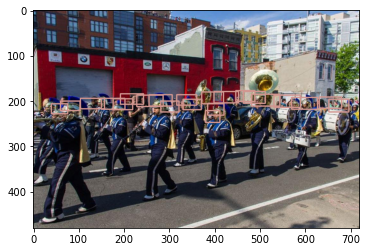

Done predictions with time 0.513 s
tf.Tensor([0.99632794 0.8200344 ], shape=(2,), dtype=float32)
(2,)


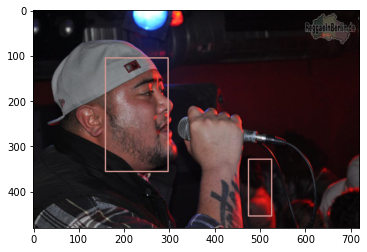

Done predictions with time 0.493 s
tf.Tensor([0.9977289], shape=(1,), dtype=float32)
(1,)


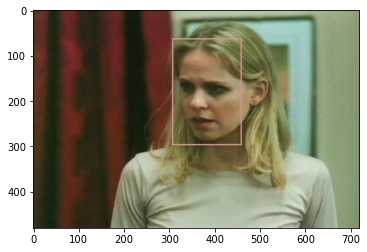

Done predictions with time 0.521 s
tf.Tensor([0.98556256 0.9874758  0.98779976 0.90658927 0.5060618 ], shape=(5,), dtype=float32)
(5,)


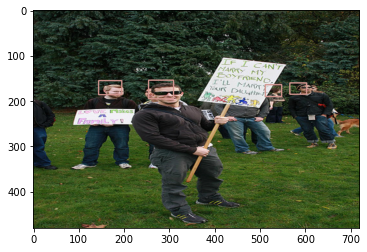

In [9]:
i=0

for valid_images, target_bbox, target_class in test_iterator:
    
    start = time.time()
    m_outputs = detr(valid_images, training=False)
    predicted_bbox, predicted_labels, predicted_scores = get_model_inference(m_outputs, config.background_class, bbox_format="xy_center")
    print("Done predictions with time %.3f s"%(time.time()-start))
    print(predicted_scores)
    
    result = numpy_bbox_to_image(
        np.array(valid_images[0]),
        np.array(predicted_bbox),
        np.array(predicted_labels),
        scores=np.array(predicted_scores),
        class_name=class_names, 
        config=config
    )
    plt.imshow(result)
    plt.savefig("wider%i.jpg"%i)
    plt.show()
    i+=1
    if i>20:
        break

In [11]:
valid_iterator, class_names = load_wider("val", config.batch_size, config, augmentation=False)

       Unnamed: 0                                           filename  width  \
0               0  ../data/WIDERface/WIDER_val/images/0--Parade/0...   1024   
1               1  ../data/WIDERface/WIDER_val/images/0--Parade/0...   1024   
2               2  ../data/WIDERface/WIDER_val/images/0--Parade/0...   1024   
3               3  ../data/WIDERface/WIDER_val/images/0--Parade/0...   1024   
4               4  ../data/WIDERface/WIDER_val/images/0--Parade/0...   1024   
...           ...                                                ...    ...   
25069       25069  ../data/WIDERface/WIDER_val/images/9--Press_Co...   1024   
25070       25070  ../data/WIDERface/WIDER_val/images/9--Press_Co...   1024   
25071       25071  ../data/WIDERface/WIDER_val/images/9--Press_Co...   1024   
25072       25072  ../data/WIDERface/WIDER_val/images/9--Press_Co...   1024   
25073       25073  ../data/WIDERface/WIDER_val/images/9--Press_Co...   1024   

       height class  xmin  ymin  xmax  ymax  
0    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


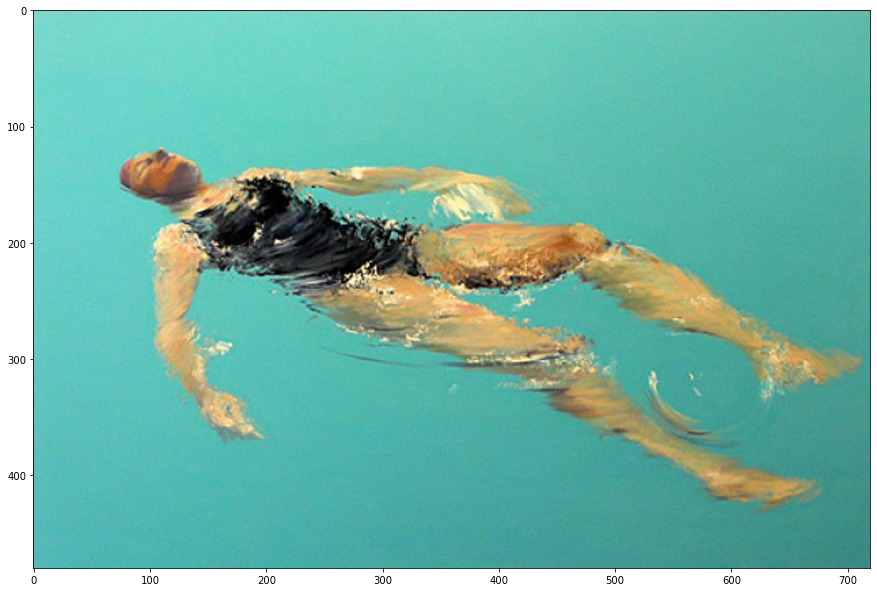

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


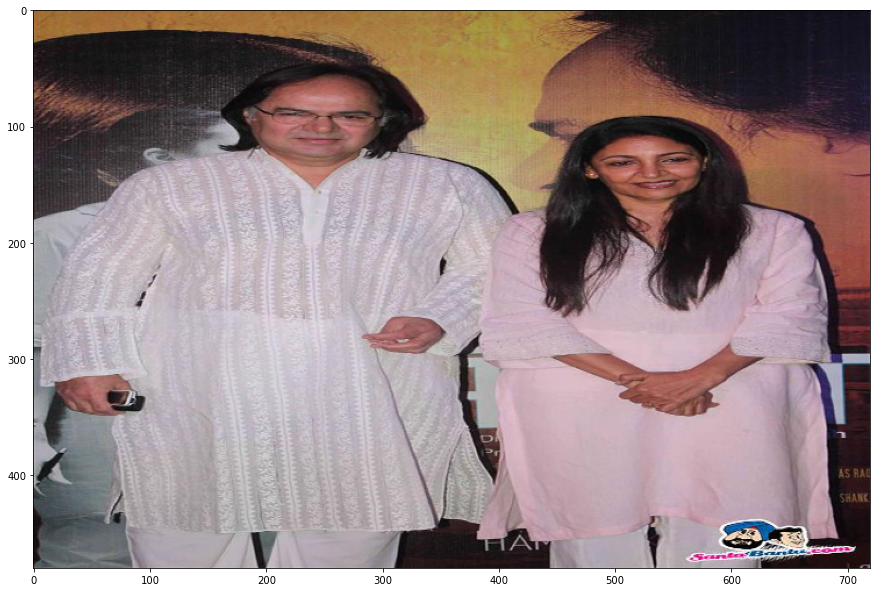

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


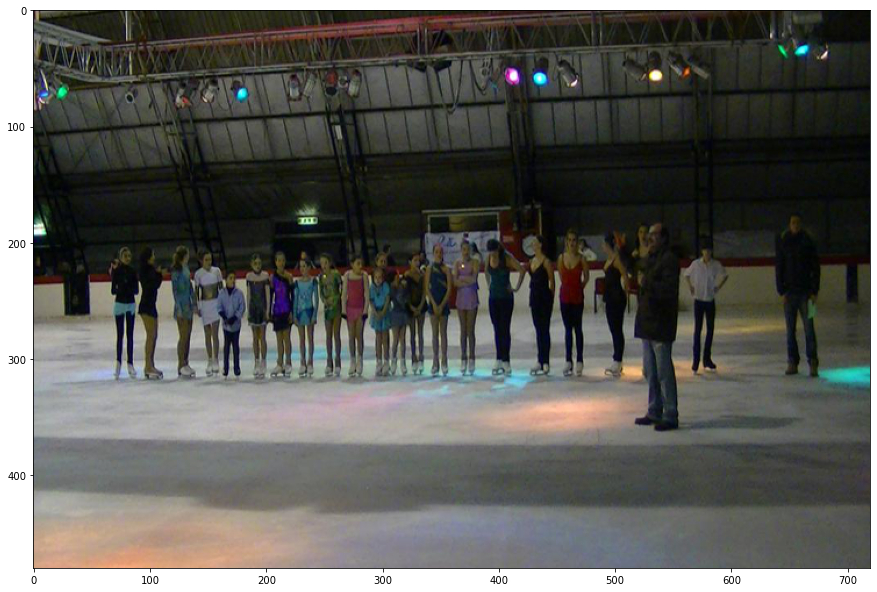

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


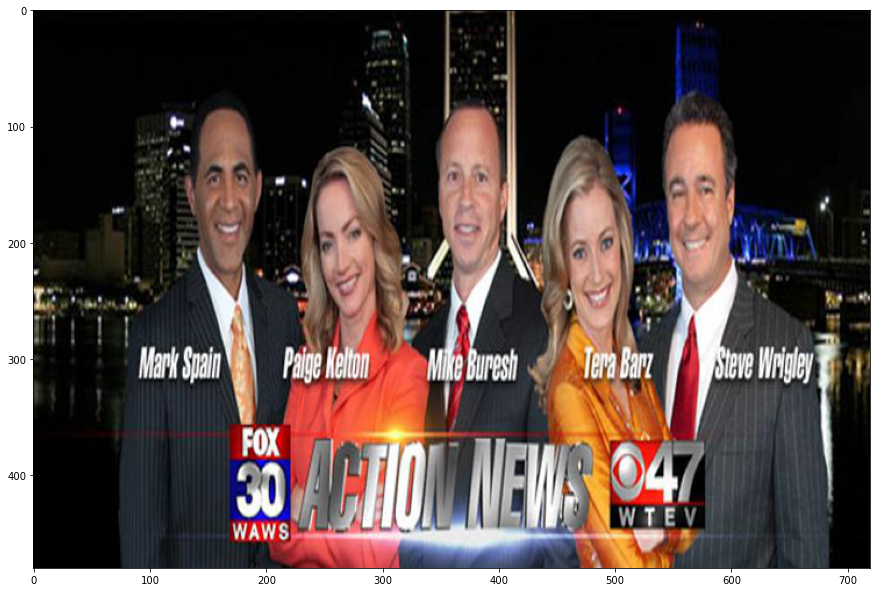

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


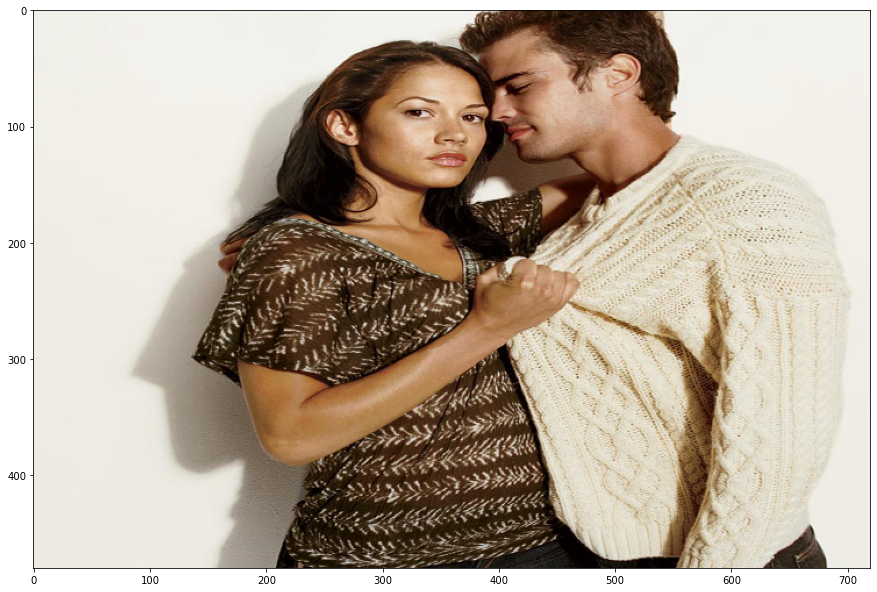

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


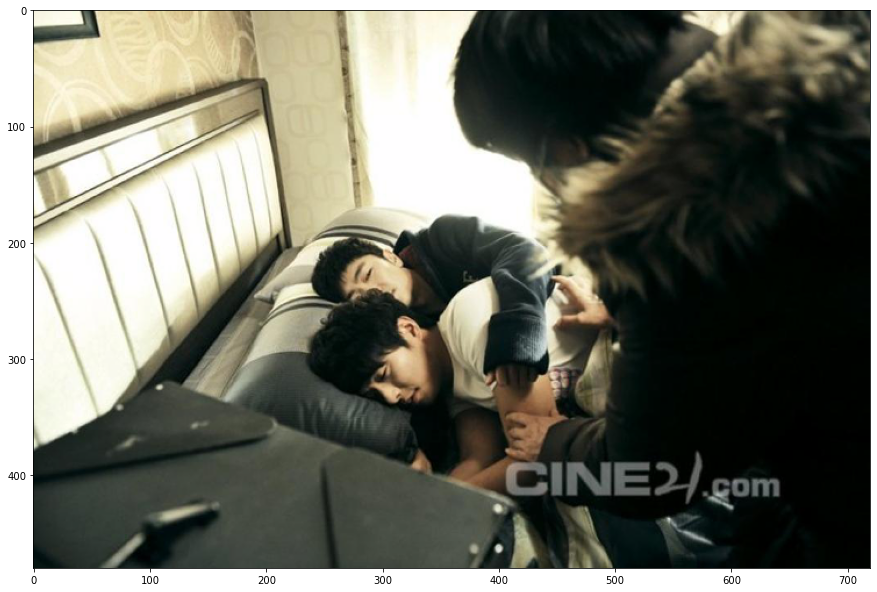

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


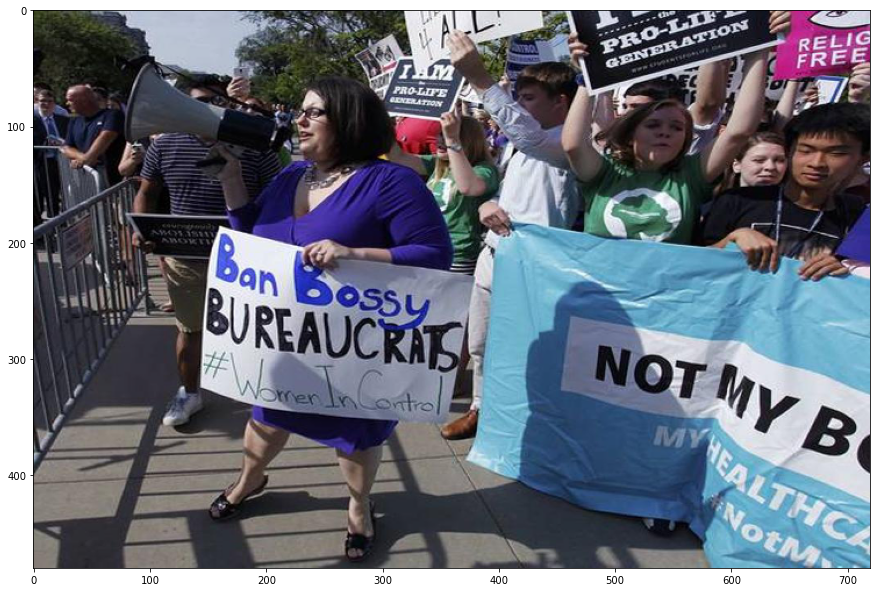

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


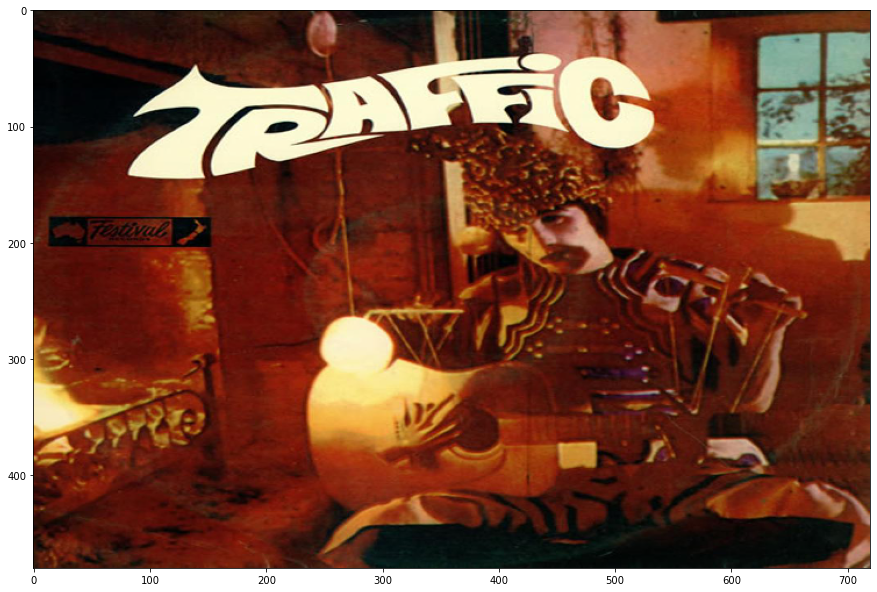

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


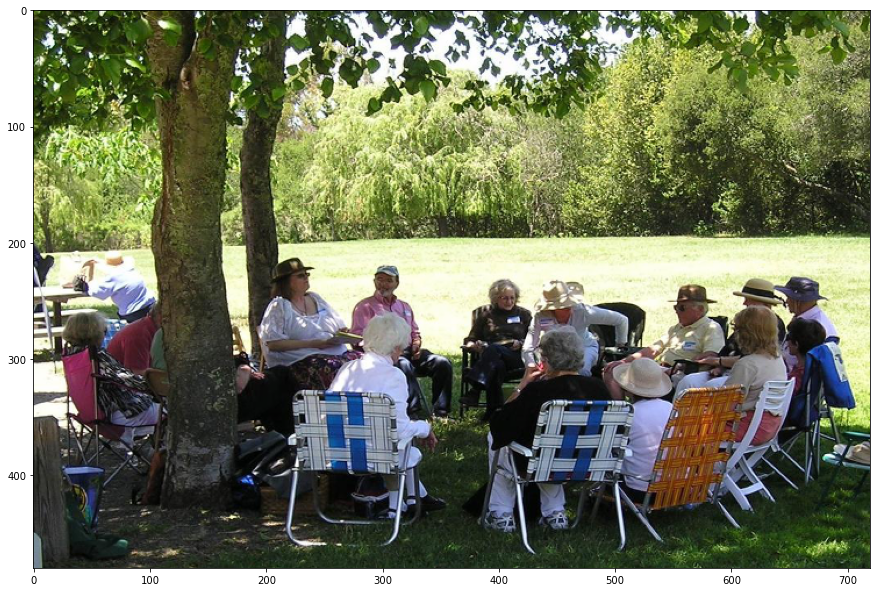

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


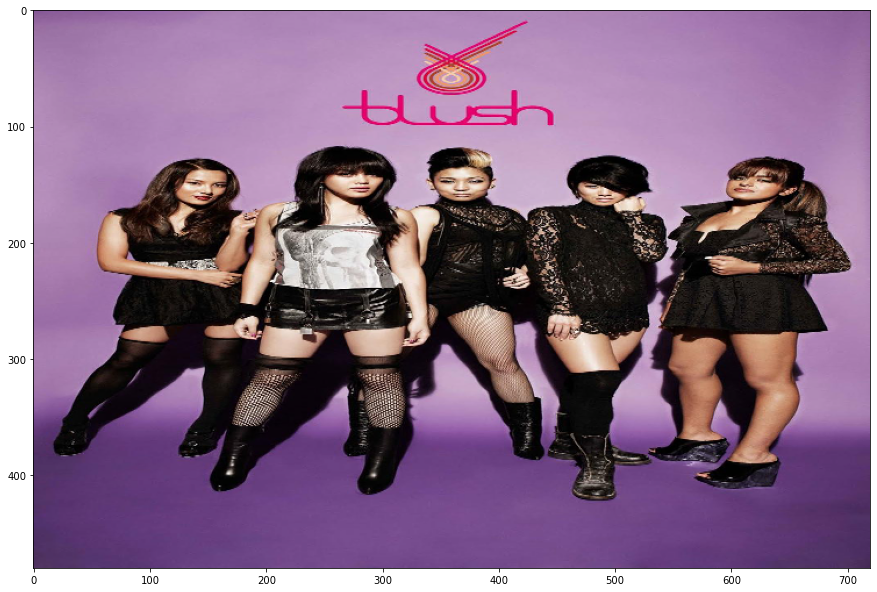

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


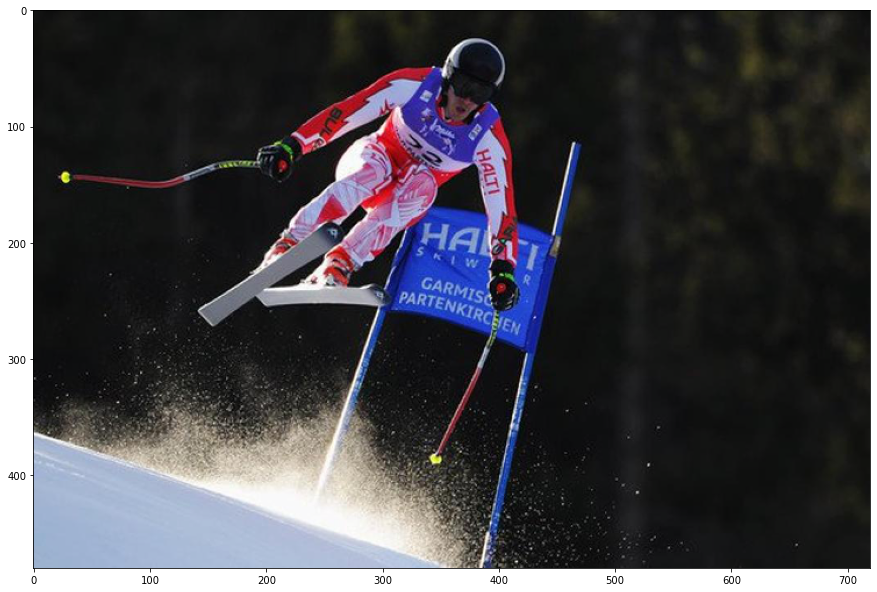

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(480, 720, 3) (0, 4)


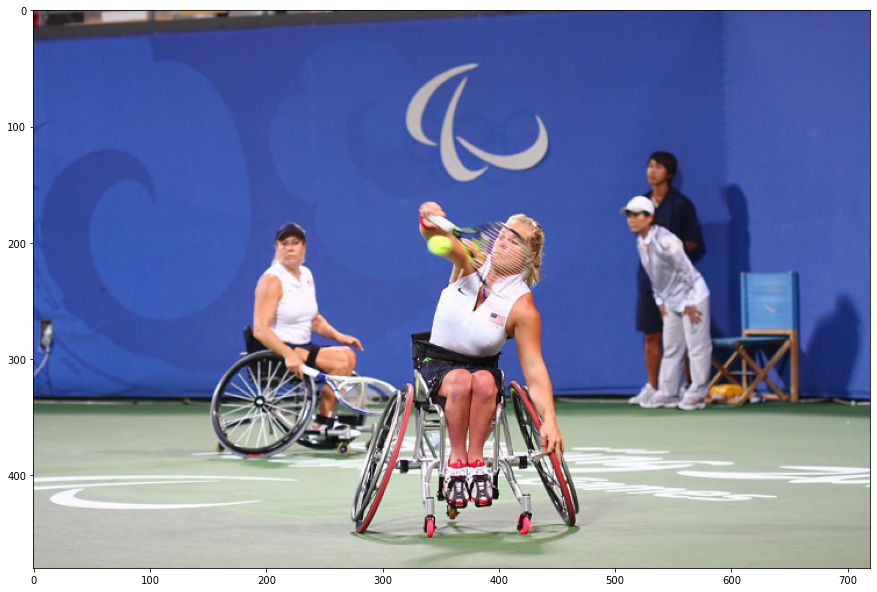

In [12]:
from detr_tf.inference import get_model_inference, numpy_bbox_to_image
import matplotlib.pyplot as plt
import numpy as np

i=0
for valid_images, target_bbox, target_class in valid_iterator:
    
    
    m_outputs = detr(valid_images, training=False)
    predicted_bbox, predicted_labels, predicted_scores = get_model_inference(m_outputs, config.background_class, bbox_format="xy_center")

    result = numpy_bbox_to_image(
        np.array(valid_images[0]),
        np.array(predicted_bbox),
        np.array(predicted_labels),
        scores=np.array(predicted_scores),
        class_name=class_names, 
        config=config
    )
    plt.figure(figsize=(15,15))
    plt.imshow(result)
    plt.savefig("pic%i.jpg"%i)
    plt.show()
    
    if i>10:
        break
    i+=1

## DETR analysis

In [6]:
from detr_tf.networks.detr import get_detr_model

#detr_sec = get_detr_model(config, include_top=False, nb_class=2, weights="detr")
#detr_sec.load_weights("detr-transfer-full-10epoch.ckpt")


detr_sec = get_detr_model(config, include_top=False, nb_class=2, weights="detr")


Load weights from weights/detr\detr.ckpt
(6, None, 100, 256)


In [7]:
detr_sec.load_weights("detr-transfolearn-third.ckpt")

In [8]:
detr_sec.summary()

Model: "detr_finetuning"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
detr (Model)                    (6, None, 100, 256)  41449152    input_2[0][0]                    
__________________________________________________________________________________________________
pos_layer (Sequential)          (6, None, 100, 4)    132612      detr[1][0]                       
__________________________________________________________________________________________________
cls_layer (Dense)               (6, None, 100, 2)    514         detr[1][0]                       
____________________________________________________________________________________

In [9]:
valid_iterator, class_names = load_wider("val", config.batch_size, config, augmentation=False)

       Unnamed: 0                                           filename  width  \
0               0  ../data/WIDERface/WIDER_val/images/0--Parade/0...   1024   
1               1  ../data/WIDERface/WIDER_val/images/0--Parade/0...   1024   
2               2  ../data/WIDERface/WIDER_val/images/0--Parade/0...   1024   
3               3  ../data/WIDERface/WIDER_val/images/0--Parade/0...   1024   
4               4  ../data/WIDERface/WIDER_val/images/0--Parade/0...   1024   
...           ...                                                ...    ...   
25069       25069  ../data/WIDERface/WIDER_val/images/9--Press_Co...   1024   
25070       25070  ../data/WIDERface/WIDER_val/images/9--Press_Co...   1024   
25071       25071  ../data/WIDERface/WIDER_val/images/9--Press_Co...   1024   
25072       25072  ../data/WIDERface/WIDER_val/images/9--Press_Co...   1024   
25073       25073  ../data/WIDERface/WIDER_val/images/9--Press_Co...   1024   

       height class  xmin  ymin  xmax  ymax  
0    

In [11]:
#used for printing sizes of stuff

import tensorflow as tf
tf.autograph.set_verbosity(0)
import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)

for valid_images, target_bbox, target_class in valid_iterator:
    m_outputs = detr_sec(valid_images, training=False)
    predicted_bbox, predicted_labels, predicted_scores = get_model_inference(m_outputs, config.background_class, bbox_format="xy_center")
    break

In [12]:
#from detr_tf.networks.position_embeddings import PositionEmbeddingSine
from detr_tf.networks.custom_layers import Linear, FixedEmbedding
from tensorflow.keras.layers import Dropout, Activation, LayerNormalization

#print(valid_images.shape)

model_dim = 256

new_model = tf.keras.Model(detr_sec.get_layer('detr').input, detr_sec.get_layer('detr').get_layer('position_embedding_sine').output)
#new_model = tf.keras.Model(detr_sec.input, detr_sec.get_layer('detr').get_layer('position_embedding_sine').output)


#detr

x = detr_sec.get_layer('detr').get_layer('backbone')(valid_images)
masks = tf.zeros((tf.shape(x)[0], tf.shape(x)[1], tf.shape(x)[2]), tf.bool)
mask = tf.cast(masks,tf.float32)

pos_encoding = detr_sec.get_layer('detr').get_layer('position_embedding_sine')(masks)

query_embed = FixedEmbedding((100, 256),name='query_embed')
query_encoding = query_embed(tf.constant(1.0))

#Transformer

im = new_model(valid_images)

im = tf.reshape(im, [1, -1, model_dim])
im = tf.transpose(im, [1, 0, 2])
#im = tf.reshape(im,(345, 1, 256))
#im = tf.transpose(im, [1, 0, 2])

pos_encoding = tf.reshape(pos_encoding, [1, -1, model_dim])
pos_encoding = tf.transpose(pos_encoding, [1, 0, 2])

#print(im.shape)
#pos_encoder = PositionEmbeddingSine(num_pos_features=256 // 2, normalize=True, name="position_embedding_sine")

query_encoding = tf.expand_dims(query_encoding, axis=1)
query_encoding = tf.tile(query_encoding, [1, 1, 1])

mask = tf.reshape(mask, [1, -1])


target = tf.zeros_like(query_encoding)

#print("query, pos and mask:",query_encoding.shape, pos_encoding.shape, mask.shape)

#IN query, pos and mask: (100, 1, 256) (345, 1, 256) (1, 345)
#query, pos and mask: (100, 1, 256) (345, 1, 256) (1, 345)--> good until here


memory = detr_sec.get_layer('detr').get_layer('transformer').get_layer('encoder')(im, source_key_padding_mask=mask,
                              pos_encoding=pos_encoding)
#im = detr_sec.get_layer('detr').get_layer('transformer').get_layer('decoder')(im, target, masks, pos_encoding,query_encoding)


#make function, pass through all layers

dropout = Dropout(0.1)
norm1 = LayerNormalization(epsilon=1e-5, name='norm1')
norm2 = LayerNormalization(epsilon=1e-5, name='norm2')
norm3 = LayerNormalization(epsilon=1e-5, name='norm3')
activation = Activation('relu')
linear1 = Linear(2048, name='linear1')
linear2 = Linear(model_dim, name='linear2')

attn_maps = []
self_attn_maps = []
for i in range(6):
    layer_name = 'layer_%d'%i
    query_tgt = key_tgt = target + query_encoding

    attn_target =detr_sec.get_layer('detr').get_layer('transformer').get_layer('decoder').get_layer(layer_name).self_attn((query_tgt, 
                                        key_tgt, target))
    self_attn_maps.append(attn_target[0])

    #print("attn", attn_target[0].shape)
    #print("attn2", attn_target[1].shape)
    #print("target shape", target.shape)

    target += dropout(attn_target[0])
    target = norm1(target)

    query_tgt = target + query_encoding
    key_mem = memory + pos_encoding

    attn_target2 = detr_sec.get_layer('detr').get_layer('transformer').get_layer('decoder').get_layer(layer_name).multihead_attn(
                                        (query_tgt, key_mem, memory)
                                        ,key_padding_mask=mask)
    target += dropout(attn_target2[0], training=False)
    target = norm2(target)

    x = linear1(target)
    x = activation(x)
    x = dropout(x, training=False)
    x = linear2(x)
    target += dropout(x, training=False)
    target = norm3(target)
    attn_maps.append(attn_target2[0])

In [13]:
x = detr_sec.get_layer('detr').get_layer('backbone')(valid_images)
print(np.where(x.numpy() != 0))
print(np.nonzero(x.numpy()))

(array([0, 0, 0, ..., 0, 0, 0], dtype=int64), array([ 0,  0,  0, ..., 14, 14, 14], dtype=int64), array([ 0,  0,  0, ..., 22, 22, 22], dtype=int64), array([ 119,  148,  177, ..., 2010, 2012, 2019], dtype=int64))
(array([0, 0, 0, ..., 0, 0, 0], dtype=int64), array([ 0,  0,  0, ..., 14, 14, 14], dtype=int64), array([ 0,  0,  0, ..., 22, 22, 22], dtype=int64), array([ 119,  148,  177, ..., 2010, 2012, 2019], dtype=int64))


(1,)


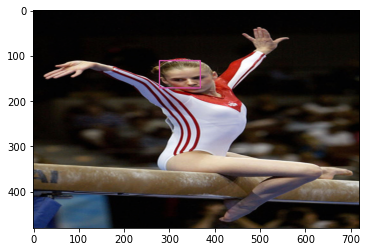

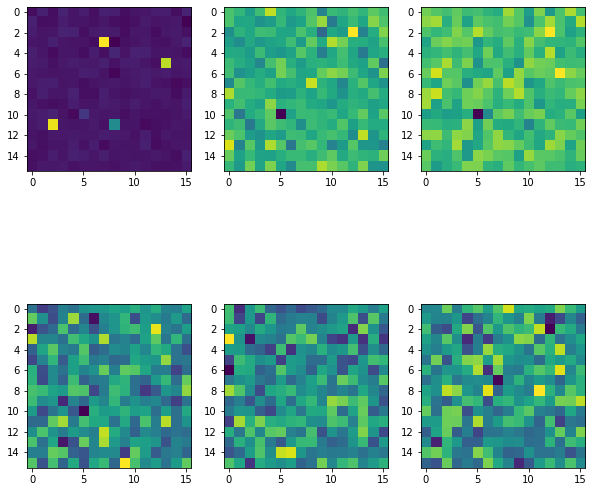

In [14]:
#self attention maps

from matplotlib import pyplot as plt

result = numpy_bbox_to_image(
        np.array(valid_images[0]),
        np.array(predicted_bbox),
        np.array(predicted_labels),
        scores=np.array(predicted_scores),
        class_name=class_names, 
        config=config
    )
plt.imshow(result)

figure, axis = plt.subplots(2, 3, figsize=(10, 10))

axis[0, 0].imshow(self_attn_maps[0].numpy()[-1][-1].reshape((16,16)))
axis[0, 1].imshow(self_attn_maps[1].numpy()[-1][-1].reshape((16,16)))
axis[0, 2].imshow(self_attn_maps[2].numpy()[-1][-1].reshape((16,16)))
axis[1, 0].imshow(self_attn_maps[3].numpy()[-1][-1].reshape((16,16)))
axis[1, 1].imshow(self_attn_maps[4].numpy()[-1][-1].reshape((16,16)))
axis[1, 2].imshow(self_attn_maps[5].numpy()[-1][-1].reshape((16,16)))

plt.show()

(1,)


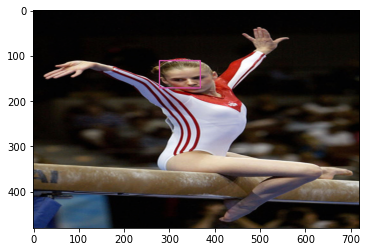

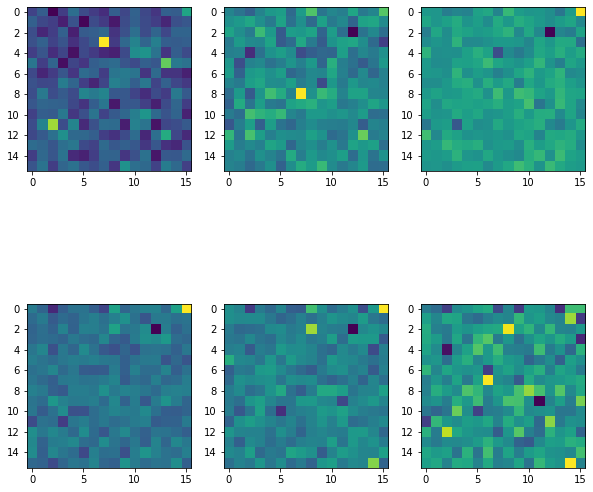

In [15]:
#attention maps

result = numpy_bbox_to_image(
        np.array(valid_images[0]),
        np.array(predicted_bbox),
        np.array(predicted_labels),
        scores=np.array(predicted_scores),
        class_name=class_names, 
        config=config
    )
plt.imshow(result)

figure, axis = plt.subplots(2, 3, figsize=(10, 10))

axis[0, 0].imshow(attn_maps[0].numpy()[-1][-1].reshape((16,16)))
axis[0, 1].imshow(attn_maps[1].numpy()[-1][-1].reshape((16,16)))
axis[0, 2].imshow(attn_maps[2].numpy()[-1][-1].reshape((16,16)))
axis[1, 0].imshow(attn_maps[3].numpy()[-1][-1].reshape((16,16)))
axis[1, 1].imshow(attn_maps[4].numpy()[-1][-1].reshape((16,16)))
axis[1, 2].imshow(attn_maps[5].numpy()[-1][-1].reshape((16,16)))

plt.show()

In [ ]:
#print(list(att.get_weights())[-1],np.array(list(att.get_weights())).shape)
for i,var in enumerate(att.trainable_variables):
    print(var.name)

In [20]:
#test pour different attention maps, ici output du transformer

#Probleme est que j'ai pas les bonnes attention maps, jsp lesquelles je prends

#maps = detr_sec.get_layer('detr').output

#detr model feedforward
im = detr_sec.get_layer('detr').get_layer('backbone')(valid_images)#interessant de visualiser convolution aussi
im = detr_sec.get_layer('detr').get_layer('input_proj')(im)
print(im.shape)

detr = detr_sec.get_layer("detr")
attn = detr(valid_images)
#print(attn[-1])
attn = attn.numpy()
#print(attn.shape)
norm = np.linalg.norm(attn)
#attn = attn/norm

(1, 15, 23, 256)
attn init: tf.Tensor(
[[[ 0.775089    0.6733697  -0.77130705 ... -0.8459317   0.37592202
    0.70049   ]]

 [[ 0.7533283   0.7030174  -0.39315045 ... -0.28154546  0.19415233
    0.6477809 ]]

 [[ 0.69234324  0.7108703  -0.5831266  ... -0.14107054  0.11639357
    0.6493243 ]]

 ...

 [[ 1.1943078   0.27343905 -0.201202   ... -0.9761923  -0.29705
    0.64688915]]

 [[ 0.5706948  -0.16385736  1.2023531  ... -1.6919672   0.22715694
   -0.76453876]]

 [[ 0.33127558 -1.1207922   0.03684229 ... -1.554745    0.4256727
    1.1009381 ]]], shape=(345, 1, 256), dtype=float32)
attn init: tf.Tensor(
[[[ 0.81153166 -0.5082816  -0.68218553 ... -0.24447936 -0.4045619
   -0.00186152]]

 [[ 0.57935035 -0.43407437 -0.4043008  ... -0.23107454 -0.23917772
   -0.14476551]]

 [[ 0.49746317 -0.6240978  -0.42976397 ... -0.3275719  -0.2358913
   -0.12734818]]

 ...

 [[ 0.26522204 -0.46903738 -0.02054559 ... -0.02431227 -0.17296854
   -0.4305396 ]]

 [[ 0.23384964 -0.5590438   0.02742191 ... -0.

(480, 720, 3) (6, 4)


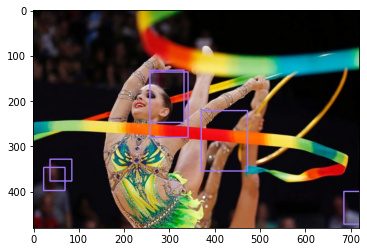

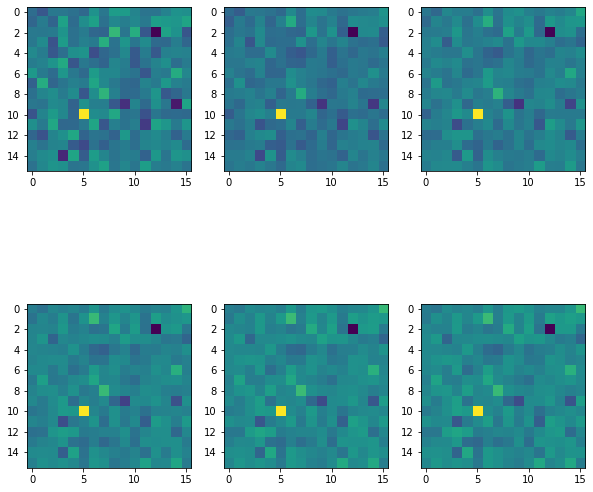

In [21]:
from matplotlib import pyplot as plt

result = numpy_bbox_to_image(
        np.array(valid_images[0]),
        np.array(predicted_bbox),
        np.array(predicted_labels),
        scores=np.array(predicted_scores),
        class_name=class_names, 
        config=config
    )
plt.imshow(result)

figure, axis = plt.subplots(2, 3, figsize=(10, 10))

axis[0, 0].imshow(attn[0][0][-1].reshape((16,16)))
axis[0, 1].imshow(attn[1][0][-1].reshape((16,16)))
axis[0, 2].imshow(attn[2][0][-1].reshape((16,16)))
axis[1, 0].imshow(attn[3][0][-1].reshape((16,16)))
axis[1, 1].imshow(attn[4][0][-1].reshape((16,16)))
axis[1, 2].imshow(attn[5][0][-1].reshape((16,16)))

plt.show()

In [53]:
#weights visu

at = []

#print(list(att.get_weights())[-1],np.array(list(att.get_weights())).shape)
for i,var in enumerate(att.trainable_variables):
    if "multihead_attn/out_proj_bias" in var.name:
        print(var.name)
        at.append(list(att.get_weights())[i])
print(len(at))
at = np.array(at)
print(at.shape)

figure, axis = plt.subplots(2, 3, figsize=(10, 10))

axis[0, 0].imshow(at[0].reshape((16,16)))

axis[0, 1].imshow(at[1].reshape((16,16)))

axis[0, 2].imshow(at[2].reshape((16,16)))

axis[1, 0].imshow(at[3].reshape((16,16)))

axis[1, 1].imshow(at[4].reshape((16,16)))

axis[1, 2].imshow(at[5].reshape((16,16)))

plt.show()

transformer/decoder/layer_0/multihead_attn/out_proj_bias:0
transformer/decoder/layer_1/multihead_attn/out_proj_bias:0
transformer/decoder/layer_2/multihead_attn/out_proj_bias:0
transformer/decoder/layer_3/multihead_attn/out_proj_bias:0
transformer/decoder/layer_4/multihead_attn/out_proj_bias:0
transformer/decoder/layer_5/multihead_attn/out_proj_bias:0
6
(6, 256)
